In [1]:
import json
import numpy as np
import jax.numpy as jnp

from compile_from_dict import numpy_compile, jax_compile
import pandas as pd
import corner
import matplotlib.pyplot as plt

import numpyro, os, json
import numpyro.distributions as dist
import jax.numpy as jnp
from numpyro.infer import Predictive
import arviz as az
import jax

from numpyro import handlers
from numpyro.infer import MCMC, NUTS, Predictive

In [2]:
model_name = 'M4-test'
with open(f'models/{model_name}.json', 'r') as fp:
    model_dict = json.load(fp)

In [3]:
jax_model = jax_compile(model_dict)

In [4]:
seed = 42

df_full = pd.read_hdf('../M4/grids/Chiara-dnufit.hdf5', key='df') ## edit for your grid!!

df_full['logLPhot'] = np.log10(df_full['LPhot'])

df_full['lognumax'] = np.log10(df_full['numax']*3090)

df_full['logdnufit'] = np.log10(df_full['dnufit'])

df_full['logAge'] = np.log10(df_full['age'])

#### define inputs
inputs = ['massini', 'zini', 'yini', 'alphaMLT', 'logAge', 'eta', 'alphaFe']

#### define outputs
classical_outputs = ['FeH', 'logLPhot', 'Teff']
astero_outputs = ['lognumax', 'logdnufit'] 

outputs = classical_outputs+astero_outputs

df = df_full[inputs+outputs]

df_norm = (df - df.min())/(df.max() - df.min())
df_train = df.sample(frac=0.95, random_state=seed)
df_test_norm = df_norm.drop(df_train.index)
df_test = df.drop(df_train.index)
df_small = df_full.sample(1000)

preds_norm = np.array(jax_model.jit_forward_pass(np.array(df_test[inputs])))

In [38]:
M22 = pd.read_csv('../M4/data/M4RGB_ps/M4_seismicanalysis.csv')
pbjam = pd.read_csv('../M4/data/pbjam-results-dnu-maddy.csv')

M22 = M22.merge(pbjam, on = 'star_id')

M22 = M22[~M22['star_id'].isin(['M4RGB252', 'M4RGB238', 'M4RGB217', 'M4RGB165', 'M4RGB131', 'M4RGB34', 'M4RGB25', 'M4RGB22', 'M4RGB16'])].reset_index()

IDs = M22['star_id']

dnu = M22['dnu_pbjam']
ednu_obs = M22['ednu_pbjam']
ednu_pred = 0.007*dnu
ednu = np.sqrt(ednu_obs**2 + ednu_pred**2)

LPhot = M22['Lum_bol'] + 2
eLPhot_obs = np.sqrt(M22['Lum_bol_err_random']**2 + M22['Lum_bol_err_systematic']**2)
eLPhot_pred = 0.011*LPhot
eLPhot = np.sqrt(eLPhot_obs**2 + eLPhot_pred**2)

Teff = M22['Teff_final'] - 70

maxes_in = df[inputs].max().values
mins_in = df[inputs].min().values
maxes_out = df[outputs].max().values
mins_out = df[outputs].min().values

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [39]:
obs_values = np.full((len(outputs) + 3), None)
        
obs_dict = {}
        
for key, value in zip(outputs + ['LPhot', 'numax', 'dnuSer'], obs_values):
    if key not in obs_dict:
        obs_dict[key] = value
    else:
        obs_dict[key].append(value)
obs_dict

{'FeH': None,
 'logLPhot': None,
 'Teff': None,
 'lognumax': None,
 'logdnufit': None,
 'LPhot': None,
 'numax': None,
 'dnuSer': None}

In [40]:
def massfromage(age):
    logage = np.log(age)
    return np.exp(-0.3*logage + 2.4)

def lnsigmoid(x, k, mini, spread):
    s = k*(x - mini)/spread
    y = (1 + jnp.exp(-s))
    return -1*jnp.log(y)

def sample_beta(param_name, loc, scale, alpha = 2, beta = 2):

    beta_samp = numpyro.sample(f'{param_name}_beta', dist.Beta(alpha, beta))

    return numpyro.deterministic(param_name, loc + scale*beta_samp)

In [41]:
def star(uncs, obs = obs_dict):

    with numpyro.plate("star", num_stars):    

        age = numpyro.sample('age', dist.TruncatedNormal(11000, 3000, low = 100, high = 16000))

        tau = sample_beta('tau', 1.0, 0.5, alpha = 2, beta = 2)

        massini = numpyro.deterministic ('massini', tau*jnp.exp(-0.3*jnp.log(age) + 2.4))

        numpyro.factor('logfac',lnsigmoid(massini, 10, 0.7, 0.01))

        zini = sample_beta('zini', 0.5*0.01756*10**-1.1, 2*0.01756*10**-1.1, alpha = 2, beta = 2) #This is probably far too conservative 

        yini = sample_beta('yini', 0.23, 0.05, alpha = 2.5, beta = 5)

        alphaMLT = sample_beta('alphaMLT', 1.5, 0.8, alpha = 1.5, beta = 1.5)

        eta = sample_beta('eta', 0.0004, 0.29, alpha = 1.5, beta = 1.5)

        alphaFe = sample_beta('alphaFe', 0.31, 0.15, alpha = 5, beta = 5)
#        alphaFe = numpyro.sample('alphaFe', dist.Normal(uncs['alphaFe'], 0.05))
        #I have put this here as a custom prior on each star - really it should be in the data, but that requires retraining the network I think
               
        params_unnorm = jnp.stack([massini, zini, yini, alphaMLT, jnp.log10(age), eta, alphaFe], axis = -1)

        params_norm = (params_unnorm - mins_in)/(maxes_in - mins_in)

        pred_norm = jax_model.jit_forward_pass(params_norm)

        pred = pred_norm*(maxes_out - mins_out) + mins_out

    FeH = numpyro.sample("FeH", dist.StudentT(df = 10, loc = pred[:, 0], scale = uncs['FeH']), obs=obs['FeH'])
    
    LPhot = numpyro.sample("LPhot", dist.StudentT(df = 10, loc = 10**pred[:, 1], scale = uncs['LPhot']), obs=obs['LPhot'])
    
    Teff = numpyro.sample("Teff", dist.StudentT(df = 10, loc = pred[:, 2], scale = uncs['Teff']), obs=obs['Teff'])

#    numax = numpyro.sample("numax", dist.StudentT(df = 3, loc = 10**(pred[:, 3]), scale = uncs['numax']), obs=obs['numax'])

    dnu = numpyro.sample("dnuSer", dist.StudentT(df = 10, loc = 10**(pred[:, 4]), scale = uncs['dnuSer']), obs=obs['dnuSer'])



M4RGB10


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:57<00:00, 14.89it/s, 1023 steps of size 5.47e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11253.37   2411.96  11404.40   8009.06  15947.79     35.92      1.00
 alphaFe_beta[0]      0.51      0.15      0.52      0.25      0.74     81.32      1.01
alphaMLT_beta[0]      0.34      0.16      0.32      0.05      0.56     49.38      1.00
     eta_beta[0]      0.47      0.23      0.47      0.07      0.83     94.40      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.69     40.25      1.00
    yini_beta[0]      0.31      0.16      0.29      0.04      0.54     47.39      1.00
    zini_beta[0]      0.56      0.10      0.56      0.40      0.73     87.82      1.00

Number of divergences: 0
M4RGB104


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:40<00:00, 15.36it/s, 1023 steps of size 4.37e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11712.66   2344.28  12016.54   8138.34  15666.71     34.65      1.00
 alphaFe_beta[0]      0.52      0.15      0.54      0.24      0.75     48.97      1.02
alphaMLT_beta[0]      0.26      0.15      0.24      0.04      0.46     48.91      1.00
     eta_beta[0]      0.43      0.23      0.42      0.04      0.77     48.09      1.00
     tau_beta[0]      0.63      0.04      0.63      0.57      0.68     30.72      1.02
    yini_beta[0]      0.32      0.16      0.30      0.04      0.55     33.04      1.01
    zini_beta[0]      0.57      0.10      0.56      0.41      0.73     61.56      1.01

Number of divergences: 0
M4RGB124


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:39<00:00, 15.39it/s, 1023 steps of size 9.84e-04. acc. prob=0.90]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11210.74   2261.56  11213.37   7313.77  14851.25    125.93      1.00
 alphaFe_beta[0]      0.51      0.15      0.51      0.26      0.76    292.18      1.00
alphaMLT_beta[0]      0.33      0.16      0.31      0.06      0.57    184.49      1.00
     eta_beta[0]      0.48      0.25      0.48      0.08      0.87    325.49      1.00
     tau_beta[0]      0.61      0.04      0.62      0.55      0.68    168.38      1.00
    yini_beta[0]      0.33      0.17      0.31      0.06      0.59    162.78      1.00
    zini_beta[0]      0.55      0.10      0.55      0.38      0.71    208.70      1.00

Number of divergences: 0
M4RGB129


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:47<00:00, 15.18it/s, 1023 steps of size 7.23e-04. acc. prob=0.92]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11563.38   2194.84  11733.87   7824.73  14947.06     89.30      1.00
 alphaFe_beta[0]      0.51      0.15      0.52      0.27      0.78    137.96      1.01
alphaMLT_beta[0]      0.27      0.14      0.25      0.04      0.47    100.26      1.01
     eta_beta[0]      0.48      0.24      0.48      0.06      0.84    149.67      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.68     90.91      1.00
    yini_beta[0]      0.32      0.16      0.30      0.07      0.57     96.06      1.01
    zini_beta[0]      0.56      0.10      0.55      0.39      0.71    119.14      1.00

Number of divergences: 0
M4RGB13


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:44<00:00, 15.24it/s, 1023 steps of size 8.75e-04. acc. prob=0.94]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11701.18   2210.71  11815.73   8646.17  15953.50     79.82      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.27      0.77    243.39      1.00
alphaMLT_beta[0]      0.18      0.12      0.16      0.00      0.33    199.08      1.00
     eta_beta[0]      0.47      0.24      0.46      0.07      0.84    277.51      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.69    106.24      1.01
    yini_beta[0]      0.33      0.16      0.31      0.08      0.58    109.03      1.00
    zini_beta[0]      0.56      0.10      0.55      0.39      0.72    153.03      1.00

Number of divergences: 0
M4RGB130


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:31<00:00, 15.65it/s, 1023 steps of size 4.63e-04. acc. prob=0.92]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11808.59   2366.49  12007.18   8407.90  15973.12     29.44      1.02
 alphaFe_beta[0]      0.50      0.15      0.52      0.24      0.74     69.62      1.01
alphaMLT_beta[0]      0.31      0.16      0.30      0.04      0.53     43.02      1.01
     eta_beta[0]      0.45      0.23      0.45      0.06      0.80     63.50      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.68     35.34      1.02
    yini_beta[0]      0.32      0.16      0.30      0.04      0.56     33.21      1.02
    zini_beta[0]      0.55      0.10      0.54      0.37      0.71     79.61      1.00

Number of divergences: 0
M4RGB14


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:43<00:00, 15.27it/s, 1023 steps of size 4.93e-04. acc. prob=0.93]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11396.98   2451.01  11535.40   7793.39  15682.46     33.16      1.00
 alphaFe_beta[0]      0.52      0.15      0.53      0.25      0.74     52.97      1.01
alphaMLT_beta[0]      0.24      0.14      0.22      0.01      0.42     43.69      1.00
     eta_beta[0]      0.46      0.23      0.46      0.07      0.81     85.92      1.00
     tau_beta[0]      0.63      0.04      0.63      0.56      0.69     31.86      1.02
    yini_beta[0]      0.31      0.16      0.30      0.05      0.55     29.58      1.01
    zini_beta[0]      0.56      0.10      0.56      0.40      0.73     77.94      1.03

Number of divergences: 0
M4RGB143


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:57<00:00, 14.90it/s, 1023 steps of size 7.67e-04. acc. prob=0.92]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11378.60   2245.94  11470.49   7498.01  14936.10     68.20      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.26      0.77    180.94      1.00
alphaMLT_beta[0]      0.24      0.14      0.22      0.01      0.42    109.99      1.00
     eta_beta[0]      0.48      0.24      0.48      0.07      0.83    214.92      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.68    103.25      1.01
    yini_beta[0]      0.32      0.16      0.31      0.07      0.56    101.83      1.01
    zini_beta[0]      0.56      0.10      0.55      0.39      0.72    139.62      1.00

Number of divergences: 0
M4RGB147


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:51<00:00, 15.04it/s, 1023 steps of size 8.14e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  10193.66   2392.13  10286.14   6356.65  14091.51     82.56      1.00
 alphaFe_beta[0]      0.51      0.15      0.51      0.26      0.75    208.66      1.00
alphaMLT_beta[0]      0.55      0.18      0.54      0.23      0.83    101.48      1.00
     eta_beta[0]      0.47      0.24      0.46      0.06      0.83    264.40      1.00
     tau_beta[0]      0.61      0.04      0.61      0.54      0.68    101.49      1.00
    yini_beta[0]      0.32      0.16      0.30      0.08      0.58    104.21      1.00
    zini_beta[0]      0.55      0.11      0.55      0.38      0.72    141.53      1.00

Number of divergences: 0
M4RGB169


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:57<00:00, 14.90it/s, 1023 steps of size 6.63e-04. acc. prob=0.97]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]   9715.33   2500.29   9852.02   5962.23  14054.54     64.95      1.00
 alphaFe_beta[0]      0.51      0.15      0.51      0.28      0.77    134.82      1.01
alphaMLT_beta[0]      0.53      0.18      0.52      0.23      0.83     69.23      1.00
     eta_beta[0]      0.46      0.23      0.45      0.07      0.81    159.30      1.00
     tau_beta[0]      0.61      0.04      0.61      0.55      0.68     69.01      1.00
    yini_beta[0]      0.31      0.16      0.29      0.06      0.56     77.17      1.01
    zini_beta[0]      0.57      0.10      0.56      0.38      0.73    112.93      1.00

Number of divergences: 0
M4RGB215


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:36<00:00, 15.49it/s, 1023 steps of size 1.94e-03. acc. prob=0.94]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]   9522.07   2536.48   9439.19   5397.78  13855.57    724.60      1.00
 alphaFe_beta[0]      0.51      0.15      0.51      0.27      0.75   1123.70      1.00
alphaMLT_beta[0]      0.44      0.19      0.43      0.12      0.76    890.80      1.00
     eta_beta[0]      0.49      0.25      0.48      0.07      0.87   1316.56      1.00
     tau_beta[0]      0.60      0.04      0.60      0.53      0.67    603.56      1.00
    yini_beta[0]      0.32      0.16      0.30      0.06      0.57    737.45      1.00
    zini_beta[0]      0.55      0.11      0.54      0.37      0.74   1069.05      1.00

Number of divergences: 0
M4RGB30


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:28<00:00, 15.72it/s, 1023 steps of size 4.13e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12422.89   2250.18  12621.76   9175.40  15973.91     23.46      1.02
 alphaFe_beta[0]      0.52      0.15      0.53      0.25      0.74     43.32      1.02
alphaMLT_beta[0]      0.32      0.15      0.31      0.07      0.55     50.95      1.00
     eta_beta[0]      0.45      0.22      0.44      0.11      0.83     48.05      1.00
     tau_beta[0]      0.63      0.04      0.63      0.57      0.68     37.43      1.01
    yini_beta[0]      0.32      0.16      0.29      0.06      0.56     36.46      1.01
    zini_beta[0]      0.55      0.09      0.55      0.41      0.70     73.11      1.01

Number of divergences: 0
M4RGB31


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:50<00:00, 15.08it/s, 1023 steps of size 6.04e-04. acc. prob=0.94]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12242.13   2096.92  12451.24   9354.93  15985.77     58.10      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.27      0.77     89.50      1.00
alphaMLT_beta[0]      0.25      0.13      0.24      0.02      0.42    106.09      1.00
     eta_beta[0]      0.47      0.23      0.47      0.10      0.86    103.46      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.69     56.91      1.00
    yini_beta[0]      0.33      0.16      0.32      0.06      0.58     58.54      1.00
    zini_beta[0]      0.56      0.10      0.55      0.39      0.72     88.90      1.01

Number of divergences: 0
M4RGB358


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:27<00:00, 15.75it/s, 1023 steps of size 4.26e-04. acc. prob=0.94]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12162.44   2467.54  12299.96   8653.31  15971.12     20.57      1.02
 alphaFe_beta[0]      0.52      0.15      0.53      0.26      0.76     46.29      1.01
alphaMLT_beta[0]      0.26      0.15      0.25      0.04      0.47     47.43      1.01
     eta_beta[0]      0.45      0.23      0.45      0.12      0.85     63.23      1.00
     tau_beta[0]      0.63      0.04      0.64      0.57      0.69     31.18      1.02
    yini_beta[0]      0.30      0.16      0.28      0.05      0.54     30.36      1.01
    zini_beta[0]      0.56      0.09      0.56      0.42      0.73     65.32      1.02

Number of divergences: 0


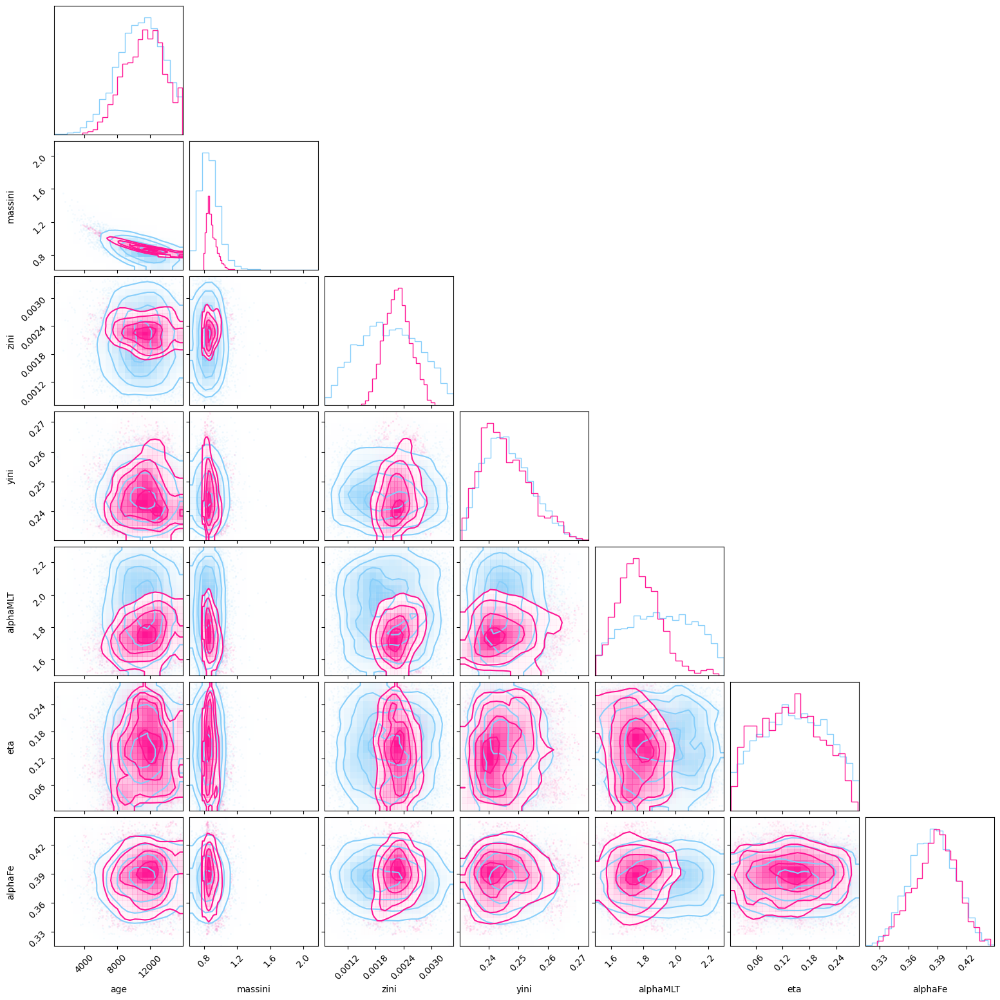

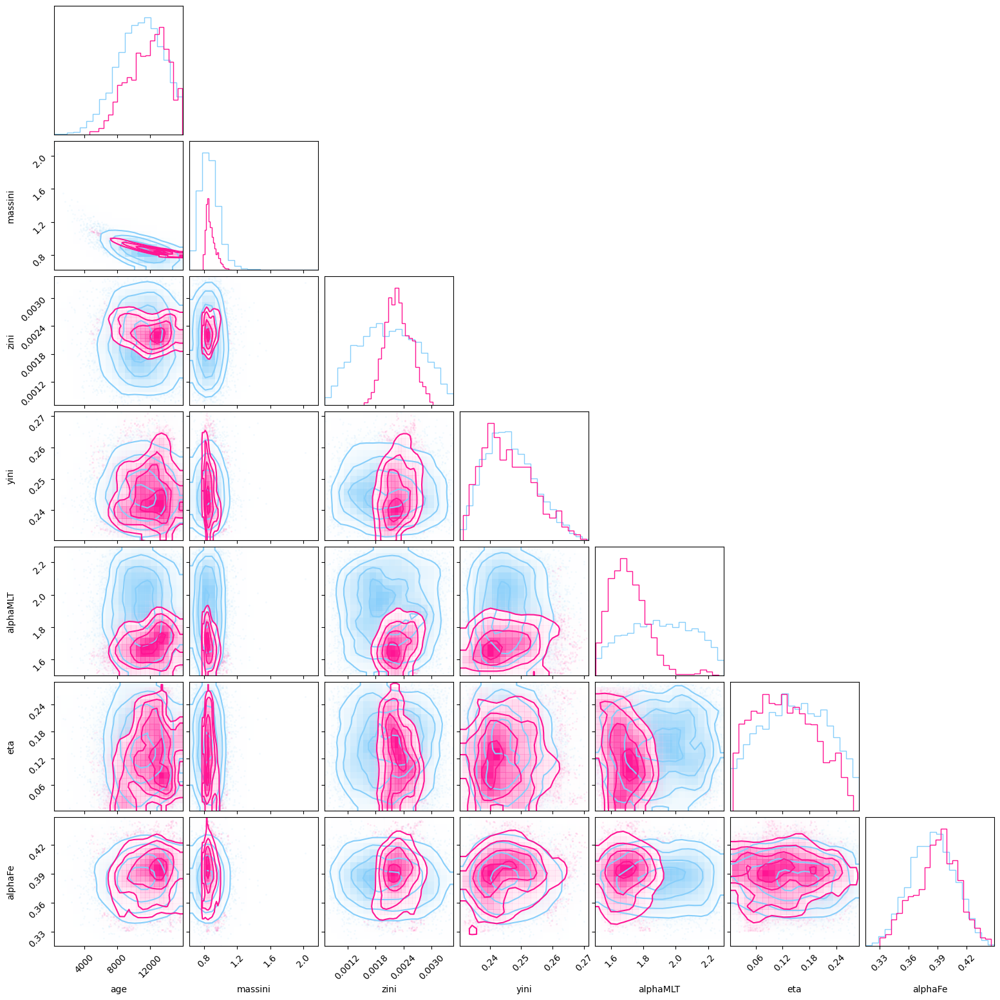

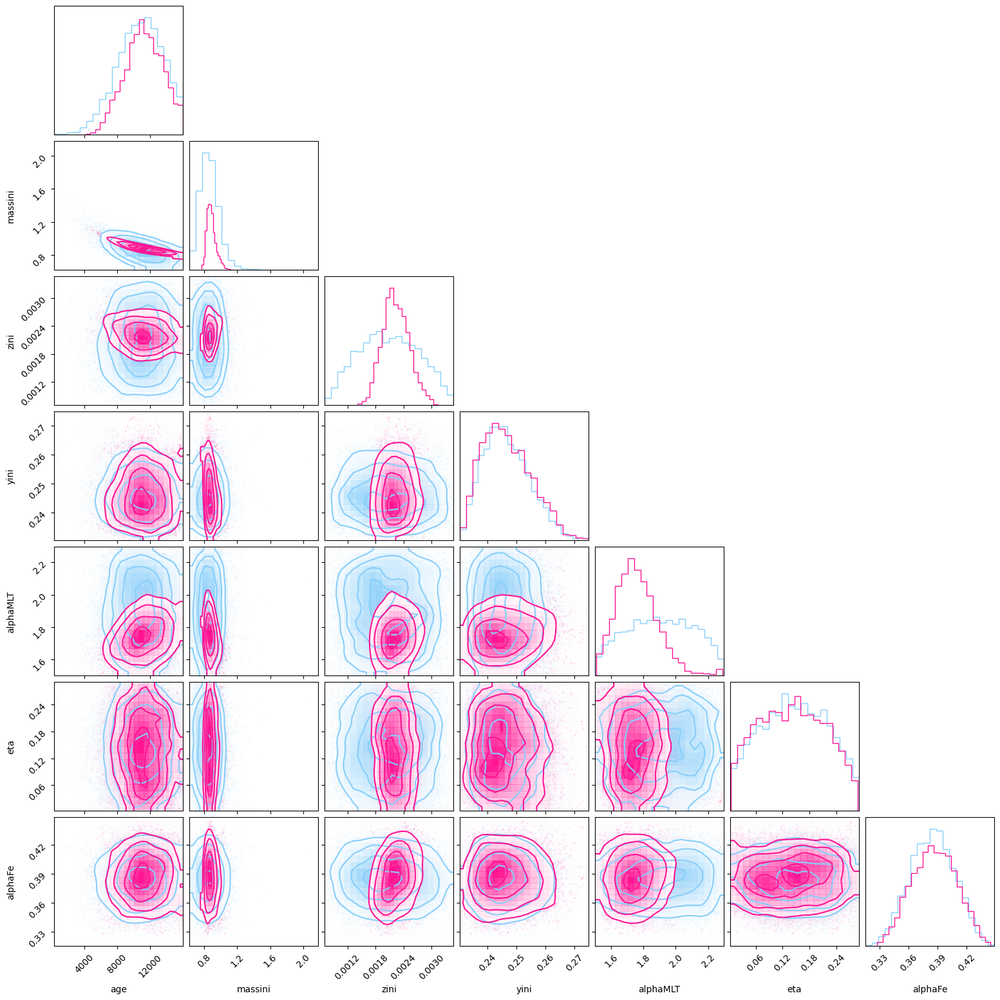

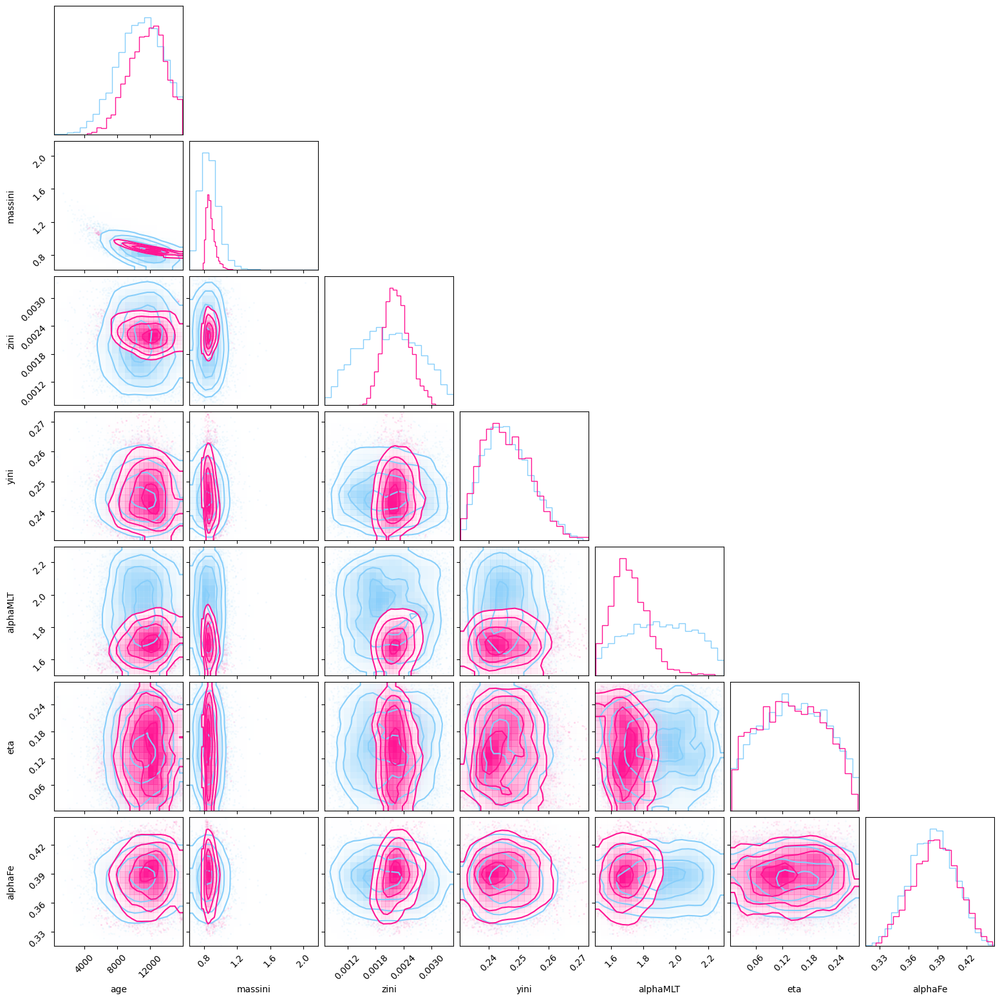

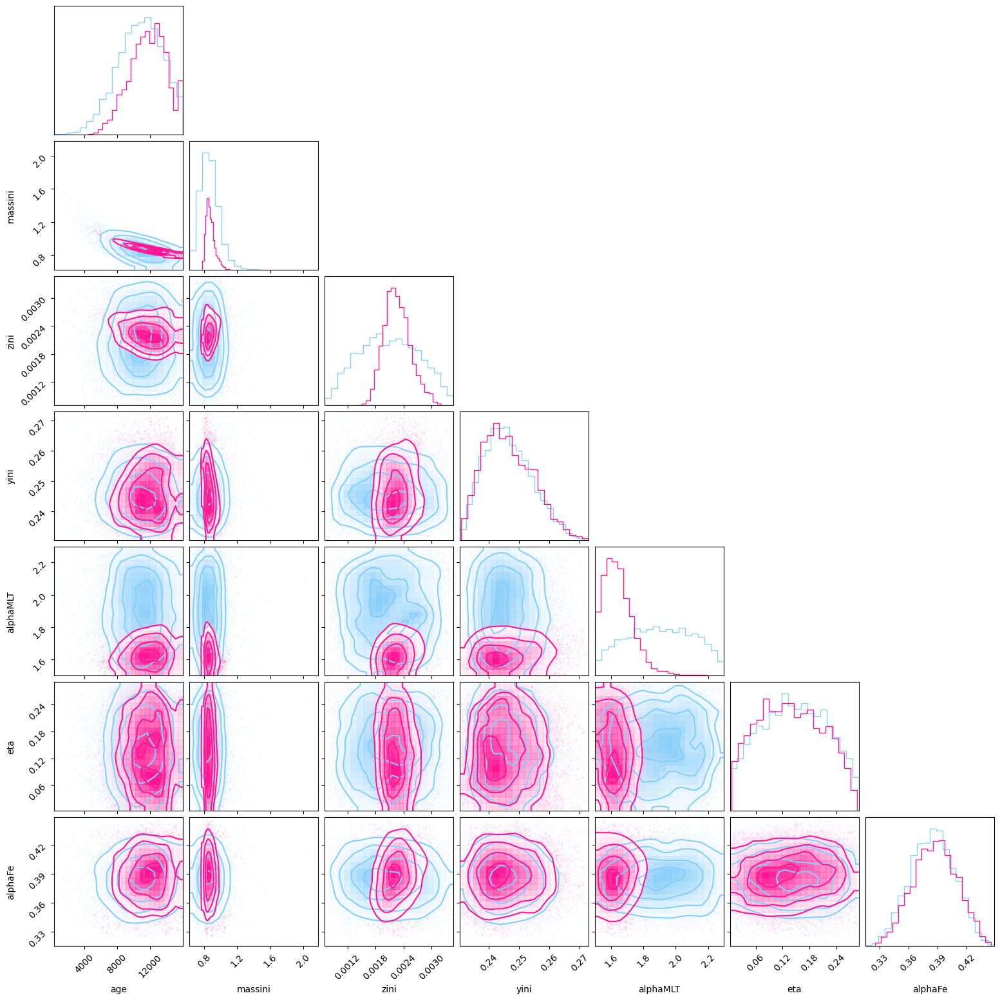

...

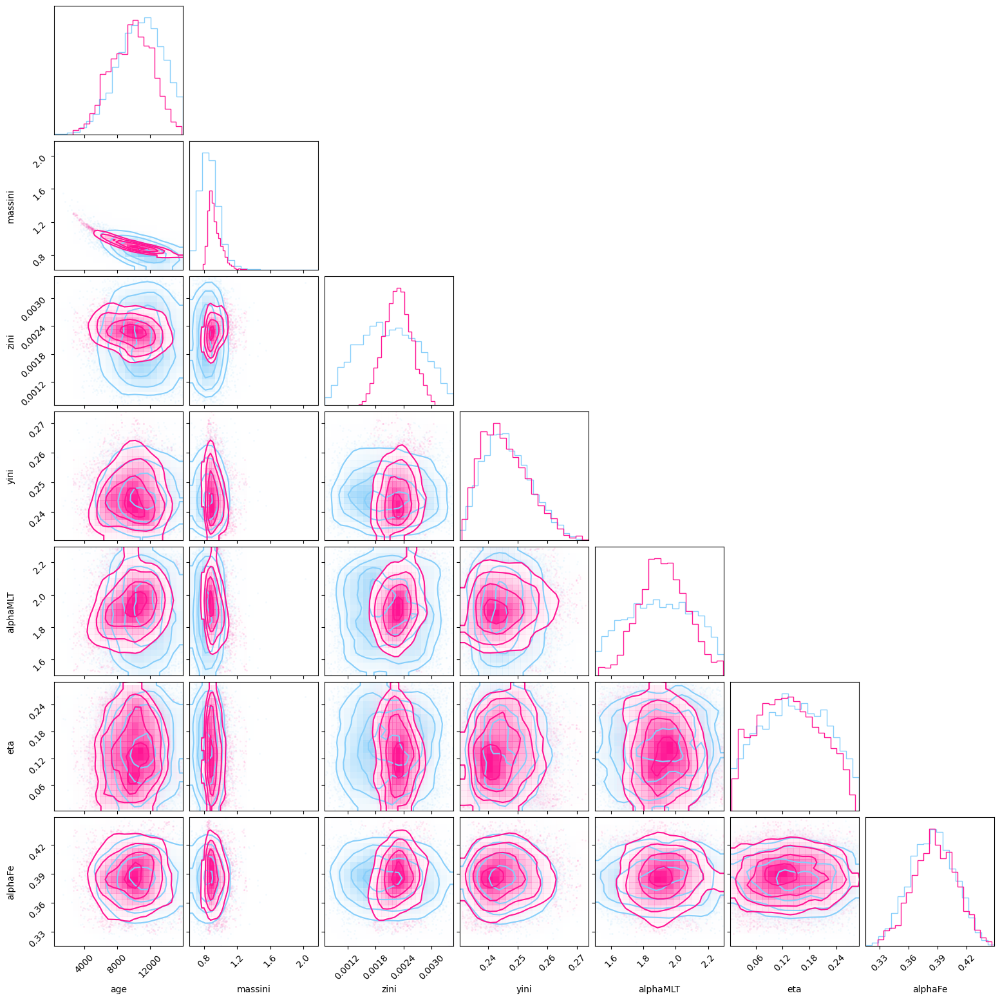

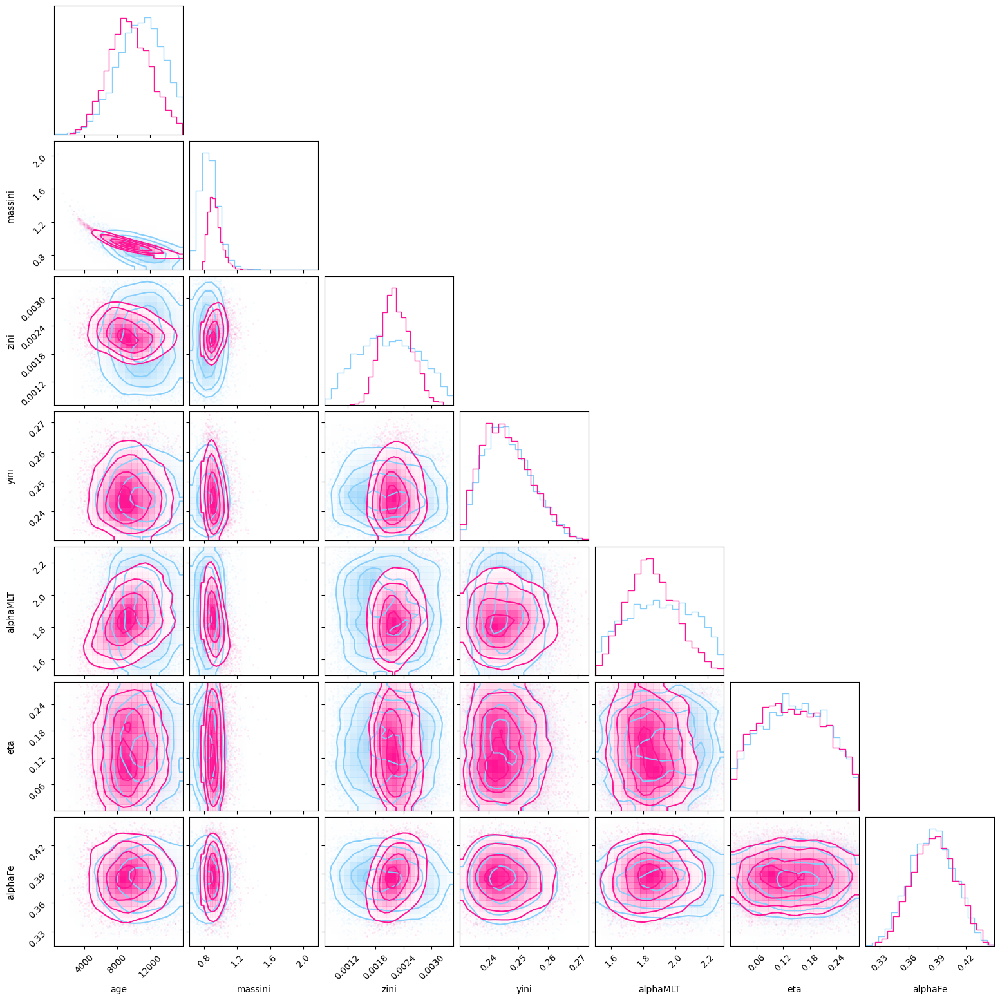

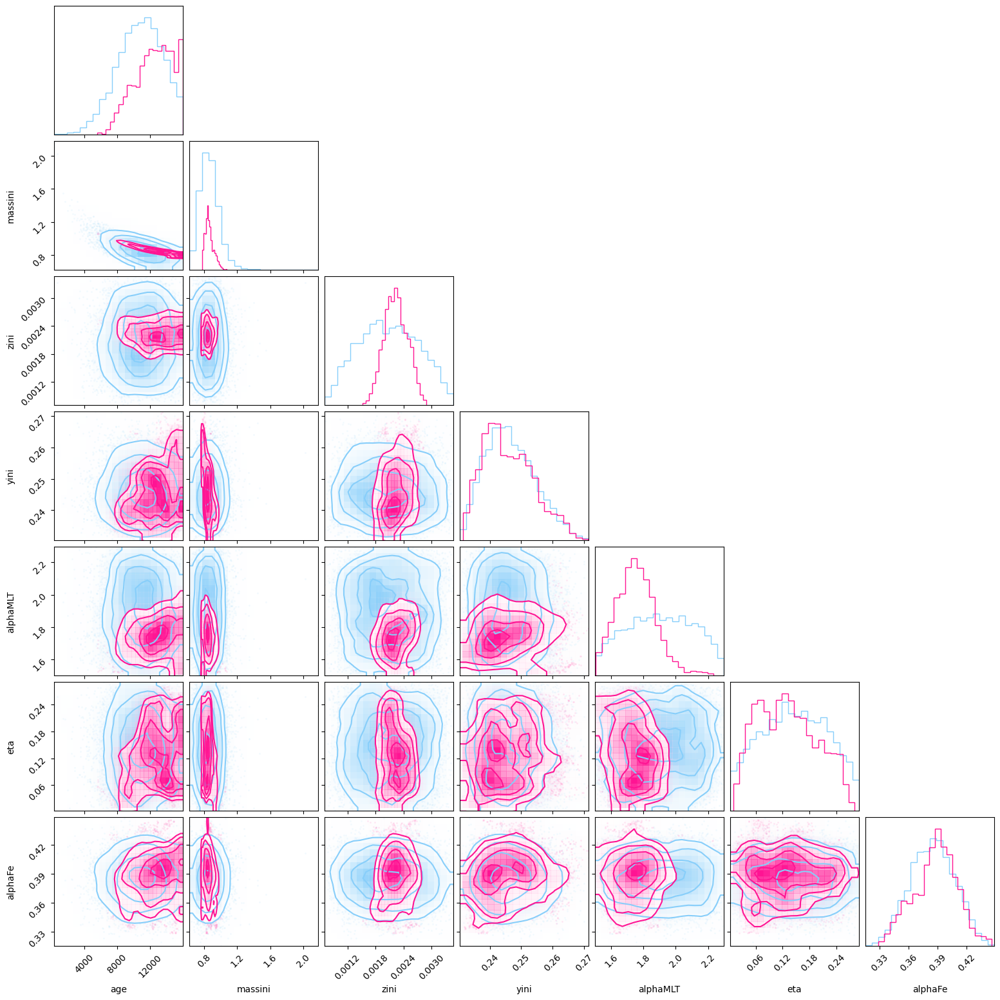

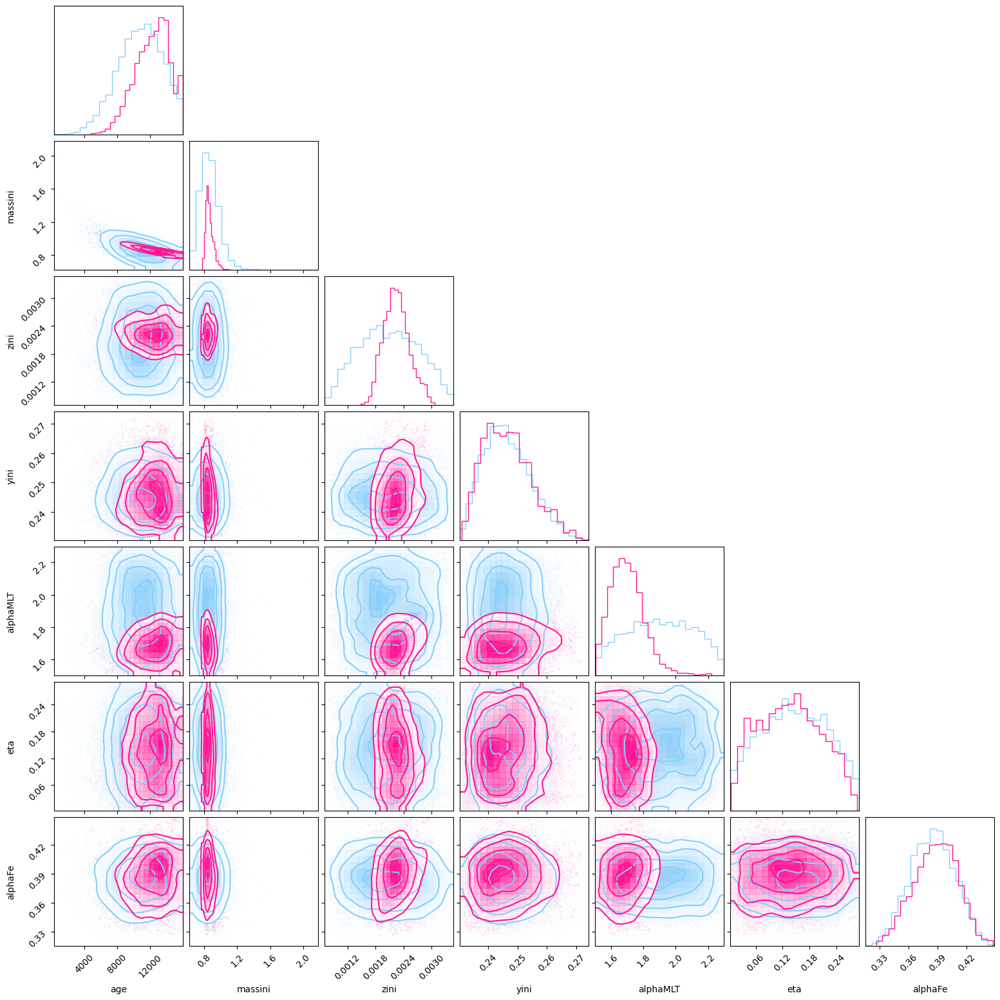

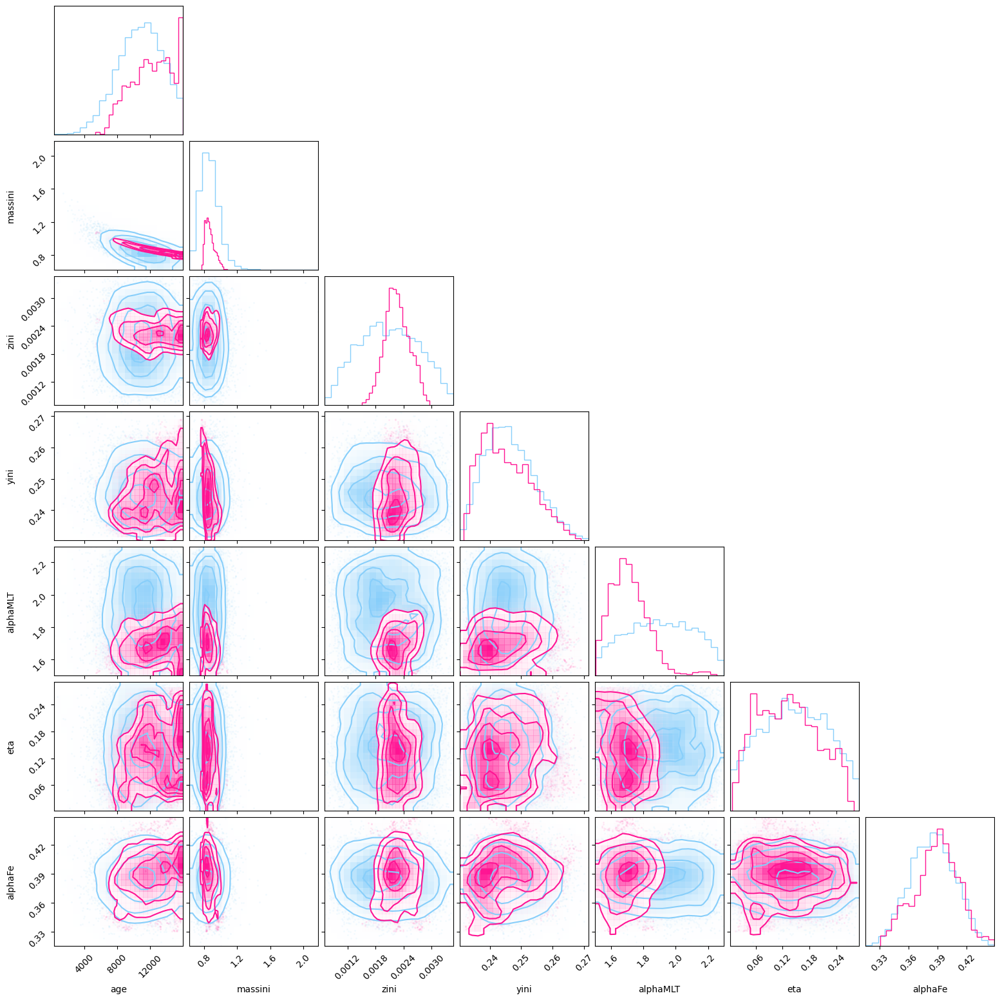

In [42]:
num_warmup, num_samples = 4000, 4000

num_chains = 1

for index in range(len(IDs)):

    num_stars = 1

    star_id = IDs.values[index]

    print(star_id)

#    if star_id in IDs_:
 #       pass
    
    obs = {'FeH':-1.07, 'alphaFe':0.39, 'Teff':Teff.values[index], 'dnuSer':dnu.values[index], 'logLPhot':np.log10(LPhot.values[index]), 'LPhot':LPhot.values[index]}
    
    unc = {'Teff':100, 'alphaFe':0.03, 'dnuSer':ednu.values[index], 'FeH':0.05, 'logLPhot':eLPhot.values[index]/LPhot.values[index]*1/np.log(10), 'LPhot':eLPhot.values[index]}
    
    sampler = NUTS(star, target_accept_prob=0.8, find_heuristic_step_size=True, init_strategy=numpyro.infer.init_to_sample) #May be worth trying init_to_sample

    mcmc = MCMC(sampler, num_warmup=num_warmup, num_samples=num_samples, num_chains=num_chains)

    rng_key = jax.random.PRNGKey(0)

    rng_key, rng_key_ = jax.random.split(rng_key)

    num_prior_samples = 4000

    prior_predictive = Predictive(star, num_samples=num_prior_samples,)

    prior = prior_predictive(rng_key_, \
                         uncs=unc, )

    coords = {"star": np.arange(num_stars)}
    dims = {}
    for key, value in prior.items():
        dims[key] = dim = []
        if value.ndim == 1:
            continue
        if value.shape[-1] == num_stars:
            dim.append("star")

    data = az.from_numpyro(prior=prior, coords=coords, dims=dims)

    mcmc.run(jax.random.PRNGKey(0),  uncs=unc, obs=obs)

    mcmc.print_summary()

    posterior = mcmc.get_samples(group_by_chain=True)

    sample_stats = mcmc.get_extra_fields(group_by_chain=True)

    rng, key = jax.random.split(jax.random.PRNGKey(0))

    sample_stats = mcmc.get_extra_fields(group_by_chain=True)

    summary_stats = numpyro.diagnostics.summary(posterior)

    data += az.from_dict(posterior, sample_stats=sample_stats, summary_stats = summary_stats, coords=coords, dims=dims)

    fig = corner.corner(data, group="prior", var_names = ['age', 'massini', 'zini', 'yini', 'alphaMLT', 'eta', 'alphaFe'],  color = 'lightskyblue', smooth = True, plot_datapoints = True,  weights = np.ones(num_prior_samples)/(num_prior_samples), coords = {'star':0})
    
    corner.corner(data, group="posterior", var_names = ['age', 'massini', 'zini', 'yini', 'alphaMLT', 'eta', 'alphaFe'],  color = 'deeppink', zorder = 1,smooth = True, plot_datapoints = True,  weights = np.ones(num_chains*num_samples)/(num_chains*num_samples),fig = fig, coords = {'star':0})
